#Fish video detection by [Tensorflow Object Detection API with TF1](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf1.md) (GPU) on Google Colab pro 🐟

# Setting UP 🔨

**Required for both training&evaluating and testing (from saved inference graph)**

## Installation

numpy 1.19.5 is required for using tensorflow 1.x with objection detection api

**Restart runtime after installing the packages and before importing**

In [ ]:
# This project requires tf 1.15.2 and numpy 1.19.5
!pip install -U "tensorflow-gpu==1.15.2"
!pip install -U "numpy==1.19.5"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 410.9 MB 31 kB/s 
     |████████████████████████████████| 50 kB 7.9 MB/s 
     |████████████████████████████████| 503 kB 57.2 MB/s 
     |████████████████████████████████| 3.8 MB 42.0 MB/s 
  Created wheel for gast: filename=gast-0.2.2-py3-none-any.whl size=7554 sha256=62ff5033b16bbc43fd3d8562d85027c2793628d059ba617039005a71e2be2f37
  Stored in directory: /root/.cache/pip/wheels/21/7f/02/420f32a803f7d0967b48dd823da3f558c5166991bfd204eef3
Successfully built gast
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.8.0
    Uninstalling tensorflow-estimator-2.8.0:
      Successfully uninstalled tensorflow-estimator-2.8.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.8.0
    Uninstalling tensorboard-2.8.0:
      Successfully uninstalled tensorboard-2.8.0
  Attempting un

## Import packages and test for GPU

In [ ]:
import tensorflow as tf
import numpy as np

import pandas as pd
from PIL import Image
import re
import os

assert tf.__version__ == '1.15.2', 'tf version is not 1.x'
assert np.__version__ == '1.19.5', 'np version is not 1.19.5'
assert tf.test.gpu_device_name() != '', 'NO GPU DEVICE DETECTED'

print(f'tf: {tf.__version__}; gpu: {tf.test.gpu_device_name()}')
print(f'np:{np.__version__}')

tf: 1.15.2; gpu: /device:GPU:0
np:1.19.5


##  Install the Tensorflow Object Detection API

In [ ]:
!git clone https://github.com/tensorflow/models.git

Cloning into 'models'...
remote: Enumerating objects: 76030, done.
remote: Counting objects: 100% (492/492), done.
remote: Compressing objects: 100% (276/276), done.
remote: Total 76030 (delta 271), reused 408 (delta 213), pack-reused 75538
Receiving objects: 100% (76030/76030), 589.48 MiB | 36.17 MiB/s, done.
Resolving deltas: 100% (53910/53910), done.


In [ ]:
%cd /content/models/research/
# Generate Python code from .proto file
!protoc object_detection/protos/*.proto --python_out=.
!cp object_detection/packages/tf1/setup.py .
# Install TensorFlow Object Detection API.
!python -m pip install .

/content/models/research
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
     |████████████████████████████████| 352 kB 5.0 MB/s 
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1694899 sha256=fec5bb00ccaf6c0c9ba9d7f0e3366bf7ff483fe2ebf9acc19be5ef0c8dfa2c6a
  Stored in directory: /tmp/pip-ephem-wheel-cache-u7ipsiqs/wheels/fa/a4/d2/e9a5057e414fd46c8e543d2706cd836d64e1fcd9eccceb2329
Successfully built object-detection


Test for installation

In [ ]:
!python /content/models/research/object_detection/builders/model_builder_tf1_test.py

Running tests under Python 3.7.13: /usr/bin/python3
[ RUN      ] ModelBuilderTF1Test.test_create_context_rcnn_from_config_with_params0 (True)
[       OK ] ModelBuilderTF1Test.test_create_context_rcnn_from_config_with_params0 (True)
[ RUN      ] ModelBuilderTF1Test.test_create_context_rcnn_from_config_with_params1 (False)
[       OK ] ModelBuilderTF1Test.test_create_context_rcnn_from_config_with_params1 (False)
[ RUN      ] ModelBuilderTF1Test.test_create_experimental_model
[       OK ] ModelBuilderTF1Test.test_create_experimental_model
[ RUN      ] ModelBuilderTF1Test.test_create_faster_rcnn_from_config_with_crop_feature0 (True)
[       OK ] ModelBuilderTF1Test.test_create_faster_rcnn_from_config_with_crop_feature0 (True)
[ RUN      ] ModelBuilderTF1Test.test_create_faster_rcnn_from_config_with_crop_feature1 (False)
[       OK ] ModelBuilderTF1Test.test_create_faster_rcnn_from_config_with_crop_feature1 (False)
[ RUN      ] ModelBuilderTF1Test.test_create_faster_rcnn_model_from_config_w

# Training and Evaluating 🔽

**Skip to the `Testing🔽` part if only testing the model on saved inference folder (can be downloaded from my Github repository)**

## Download the pre-trained Faster-RCNN-Inception-V2-COCO model

In [ ]:
%cd /content
!wget http://download.tensorflow.org/models/object_detection/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
!tar -xvf faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
!rm faster_rcnn_inception_v2_coco_2018_01_28.tar.gz

/content
--2022-08-09 07:27:46--  http://download.tensorflow.org/models/object_detection/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.31.128, 2607:f8b0:400c:c02::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.31.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149119618 (142M) [application/x-tar]
Saving to: ‘faster_rcnn_inception_v2_coco_2018_01_28.tar.gz’

faster_rcnn_incepti 100%[===================>] 142.21M   223MB/s    in 0.6s    

2022-08-09 07:27:47 (223 MB/s) - ‘faster_rcnn_inception_v2_coco_2018_01_28.tar.gz’ saved [149119618/149119618]

faster_rcnn_inception_v2_coco_2018_01_28/
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.index
faster_rcnn_inception_v2_coco_2018_01_28/checkpoint
faster_rcnn_inception_v2_coco_2018_01_28/pipeline.config
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.data-00000-of-00001
faster_rcnn_inception_v2_coco_2018_01_

## Download the corresponding configuration file (.config)

**Note**: Use the configuration file that is for the pre-trained model

In [ ]:
# Faster R-CNN with Inception v2, configuration for MSCOCO Dataset.
!wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/samples/configs/faster_rcnn_inception_v2_coco.config
# Rename the config file
!mv faster_rcnn_inception_v2_coco.config faster_rcnn_inception_v2.config

--2022-08-09 07:27:54--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/samples/configs/faster_rcnn_inception_v2_coco.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3738 (3.7K) [text/plain]
Saving to: ‘faster_rcnn_inception_v2_coco.config’

faster_rcnn_incepti 100%[===================>]   3.65K  --.-KB/s    in 0s      

2022-08-09 07:27:54 (58.1 MB/s) - ‘faster_rcnn_inception_v2_coco.config’ saved [3738/3738]



## Collect training and testing Data for the model

[Fishnet Open Images Database](chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/https://arxiv.org/pdf/2106.09178v1.pdf) is a large dataset of electronic monitoring imagery for fish detection

In [ ]:
# Download the images
!wget https://fishnet-data.s3-us-west-1.amazonaws.com/foid_images_v100.zip
!unzip foid_images_v100.zip -d .
!rm foid_images_v100.zip

Streaming output truncated to the last 5000 lines.
  inflating: ./images/fc4f6898-5952-11ec-9f34-7790cea89086.jpg  
  inflating: ./images/94e020a2-23f0-11e9-b809-576df54aa884.jpg  
  inflating: ./images/da844a48-db28-11ea-bb7d-b72e903d9cb3.jpg  
  inflating: ./images/da49cddc-db28-11ea-ad60-5fc3761d781f.jpg  
  inflating: ./images/fcfac634-5952-11ec-9d55-af665a244be3.jpg  
  inflating: ./images/94be5a08-23f0-11e9-9fa3-57f4344f655d.jpg  
  inflating: ./images/fc44519c-5952-11ec-8f45-9bd31f1af27a.jpg  
  inflating: ./images/fc54d6b6-5952-11ec-a925-5307daf9fa79.jpg  
  inflating: ./images/da6b3648-db28-11ea-a36b-eff77f5994b2.jpg  
  inflating: ./images/94b91782-23f0-11e9-b73c-b392785085ad.jpg  
  inflating: ./images/dad44fa2-db28-11ea-bdf8-2356973d6981.jpg  
  inflating: ./images/fc3c320a-5952-11ec-b9f2-d3b0649c6dca.jpg  
  inflating: ./images/94acce96-23f0-11e9-b706-838635f95abb.jpg  
  inflating: ./images/dac8238a-db28-11ea-bfff-87f15c5f5b7a.jpg  
  inflating: ./images/da73a31e-db28-11e

In [ ]:
# Download the labels
!wget https://fishnet-data.s3-us-west-1.amazonaws.com/foid_labels_v100.zip
!unzip foid_labels_v100.zip -d .
!rm foid_labels_v100.zip

--2022-08-09 07:50:16--  https://fishnet-data.s3-us-west-1.amazonaws.com/foid_labels_v100.zip
Resolving fishnet-data.s3-us-west-1.amazonaws.com (fishnet-data.s3-us-west-1.amazonaws.com)... 52.219.194.50
Connecting to fishnet-data.s3-us-west-1.amazonaws.com (fishnet-data.s3-us-west-1.amazonaws.com)|52.219.194.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9928224 (9.5M) [application/zip]
Saving to: ‘foid_labels_v100.zip’

foid_labels_v100.zi 100%[===================>]   9.47M  13.2MB/s    in 0.7s    

2022-08-09 07:50:17 (13.2 MB/s) - ‘foid_labels_v100.zip’ saved [9928224/9928224]

Archive:  foid_labels_v100.zip
  inflating: ./foid_labels_v100.csv  
  inflating: ./README.txt            
  inflating: ./__MACOSX/._README.txt  


Visualization of labels for training data 

In [ ]:
df = pd.read_csv('foid_labels_v100.csv')
df.head()

,img_id,cam_id,seq_id,frame_id,bbox_id,x_min,x_max,y_min,y_max,label_l1,label_l2,fao_mfa,train,val,test
0,da7c5ef0-db28-11ea-b693-9b3523cc10a5,60,13209,33,1,626,754,-1,88,Human,HUMAN,81,True,False,False
1,da7c5ef0-db28-11ea-b693-9b3523cc10a5,60,13209,33,3,544,710,15,203,Human,HUMAN,81,True,False,False
2,da7c5ef0-db28-11ea-b693-9b3523cc10a5,60,13209,33,4,629,735,210,562,Human,HUMAN,81,True,False,False
3,da7c5ef0-db28-11ea-b693-9b3523cc10a5,60,13209,33,5,615,883,550,907,Human,HUMAN,81,True,False,False
4,da7c5ef0-db28-11ea-b693-9b3523cc10a5,60,13209,33,6,885,962,826,875,Unknown,OTH,81,True,False,False


## Generate Record file from CSV as model inputs

In [ ]:
# Download generate_tfrecord file to convert csv files to record files
!wget https://raw.githubusercontent.com/yijing-sie/fish-video-detection-with-colab-tf1/main/generate_tfrecord.py

--2022-08-09 07:59:52--  https://raw.githubusercontent.com/yijing-sie/fish-video-detection-with-colab-tf1/main/generate_tfrecord.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3487 (3.4K) [text/plain]
Saving to: ‘generate_tfrecord.py’

generate_tfrecord.p 100%[===================>]   3.41K  --.-KB/s    in 0s      

2022-08-09 07:59:53 (61.7 MB/s) - ‘generate_tfrecord.py’ saved [3487/3487]



In [ ]:
!python generate_tfrecord.py --csv_input=foid_labels_v100.csv --image_dir=images --test_output_path=test.record  --train_output_path=train.record



W0809 08:00:07.104957 140600009914240 module_wrapper.py:139] From generate_tfrecord.py:82: The name tf.python_io.TFRecordWriter is deprecated. Please use tf.io.TFRecordWriter instead.

  0% 0/143818 [00:00<?, ?it/s]WARNING:tensorflow:From generate_tfrecord.py:40: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.

W0809 08:00:11.135098 140600009914240 module_wrapper.py:139] From generate_tfrecord.py:40: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.

100% 143818/143818 [13:33<00:00, 176.85it/s]
Successfully created the TFRecords


## Generate labelmap.pbtxt file for the mapping between `class_name` and `class_id` 

In [ ]:
! wget https://raw.githubusercontent.com/yijing-sie/fish-video-detection-with-colab-tf1/main/labelmap.pbtxt

--2022-08-09 08:14:30--  https://raw.githubusercontent.com/yijing-sie/fish-video-detection-with-colab-tf1/main/labelmap.pbtxt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 31 [text/plain]
Saving to: ‘labelmap.pbtxt’

labelmap.pbtxt      100%[===================>]      31  --.-KB/s    in 0s      

2022-08-09 08:14:30 (1.52 MB/s) - ‘labelmap.pbtxt’ saved [31/31]



## Modify configuration file for custom object detection


Start from here if the model is prepared well for continuing trainining from a check_point file (.ckpt)

In [ ]:
num_classes = 1
# Paths should be absolute except for the config_name
train_record_path = '/content/train.record'
test_record_path = '/content/test.record'
labelmap_path = '/content/labelmap.pbtxt'
fine_tune_checkpoint = '/content/faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt'

config_name = 'faster_rcnn_inception_v2.config'
model_dir = '/content/training/' # Directory to save the checkpoints and training summaries
eval_dir = '/content/eval/' # Directory to save the eval results
num_steps = 58500

Modify configuration file for custom object detection

In [ ]:
with open(config_name) as f:
    config = f.read()

with open(config_name, 'w') as f:

  # Set labelmap path
  config = re.sub('label_map_path: ".*?"', 
  'label_map_path: "{}"'.format(labelmap_path), config)
  
  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                  'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint),
                  config)
  
  # Set train tf-record file path
  config = re.sub('(input_path: "PATH_TO_BE_CONFIGURED/.*train)(.*?")', 
                  'input_path: "{}"'.format(train_record_path), config)
  
  # Set test tf-record file path
  config = re.sub('(input_path: "PATH_TO_BE_CONFIGURED/.*val)(.*?")', 
                  'input_path: "{}"'.format(test_record_path), config)
  
  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  'num_classes: {}'.format(num_classes), config)  
  # Set training steps for early stop
  config = re.sub('num_steps: [0-9]+',
                  'num_steps: {}'.format(num_steps), config)
  f.write(config)

##Train the model

TensorFlow has deprecated the "train.py" file and replaced it with "model_main.py" file, but "model_main.py" sometimes doesn't work. 

Use "train.py" from legacy folder if "model_main.py" doesn't work

Visualize the training loss with tensorboard

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

%tensorboard --logdir {model_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 953), started 3:36:30 ago. (Use '!kill 953' to kill it.)

Start training

In [ ]:
!python /content/models/research/object_detection/legacy/train.py --pipeline_config_path {config_name} --train_dir {model_dir} --logtostderr

Streaming output truncated to the last 5000 lines.
INFO:tensorflow:global step 56008: loss = 0.0008 (0.147 sec/step)
I0809 14:29:55.572723 140462905563008 learning.py:512] global step 56008: loss = 0.0008 (0.147 sec/step)
INFO:tensorflow:global step 56009: loss = 0.0029 (0.184 sec/step)
I0809 14:29:55.759654 140462905563008 learning.py:512] global step 56009: loss = 0.0029 (0.184 sec/step)
INFO:tensorflow:global step 56010: loss = 0.0008 (0.170 sec/step)
I0809 14:29:55.931562 140462905563008 learning.py:512] global step 56010: loss = 0.0008 (0.170 sec/step)
INFO:tensorflow:global step 56011: loss = 0.0003 (0.163 sec/step)
I0809 14:29:56.096105 140462905563008 learning.py:512] global step 56011: loss = 0.0003 (0.163 sec/step)
INFO:tensorflow:global step 56012: loss = 0.3126 (0.166 sec/step)
I0809 14:29:56.263522 140462905563008 learning.py:512] global step 56012: loss = 0.3126 (0.166 sec/step)
INFO:tensorflow:global step 56013: loss = 0.0005 (0.162 sec/step)
I0809 14:29:56.426713 140462

## Export inference graph

In [ ]:
output_directory = 'inference_graph'

In [ ]:
# Set checkpoint_dir the directory to the highest-numbered .ckpt file 
with open(os.path.join(model_dir, 'checkpoint')) as f:
    check_point = f.readline()
    checkpoint_dir = re.sub('model_checkpoint_path: "','',check_point)
    checkpoint_dir = checkpoint_dir[:-2]
print(checkpoint_dir)

/content/training/model.ckpt-58500


Run the following to save the inference graph and labelmap.pbtxt in Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
drive_folder = '/content/drive/MyDrive/fish_detection_and_training'
output_directory = os.path.join(drive_folder, output_directory)
!cp {labelmap_path} {os.path.join(drive_folder, 'labelmap.pbtxt')}

Mounted at /content/drive


In [ ]:
!python /content/models/research/object_detection/export_inference_graph.py --input_type image_tensor --pipeline_config_path {config_name} --trained_checkpoint_prefix {checkpoint_dir} --output_directory {output_directory}

Instructions for updating:
Please use `layer.__call__` method instead.
W0809 14:53:57.496948 139698115581824 deprecation.py:323] From /usr/local/lib/python3.7/dist-packages/tf_slim/layers/layers.py:2802: Layer.apply (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.__call__` method instead.
INFO:tensorflow:Scale of 0 disables regularizer.
I0809 14:53:58.738178 139698115581824 regularizers.py:99] Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.
I0809 14:53:58.861885 139698115581824 regularizers.py:99] Scale of 0 disables regularizer.
INFO:tensorflow:depth of additional conv before box predictor: 0
I0809 14:53:58.862290 139698115581824 convolutional_box_predictor.py:155] depth of additional conv before box predictor: 0
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
W0809 14:53:58.919250 139698115581824 deprecati

# Testing the Model 🔽

## Import packages to for detection tasks

In [ ]:
# For importing functions in `utils` folder
%cd /content/models/research/object_detection/ 
import cv2
from collections import Counter
import time 
from numpy import linalg as LA
# Import utilites
from utils import label_map_util
from utils import visualization_utils as vis_util

/content/models/research/object_detection


Set using_google_drive `False` if not employing inference_graph and the fish video from Google drive

In [ ]:
using_google_drive = True

# Download videos and inference graph solder from my github repository
if using_google_drive:
    from google.colab import files
    uploaded = files.upload()
    file_name = list(uploaded.keys())[0]
else:
    !wget https://github.com/yijing-sie/fish-video-detection-with-colab-tf1/raw/main/fish_video.mp4
    file_name = 'fish_video.mp4'

--2022-08-09 15:07:43--  https://github.com/yijing-sie/fish-video-detection-with-colab-tf1/raw/main/fish_video.mp4
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/yijing-sie/fish-video-detection-with-colab-tf1/main/fish_video.mp4 [following]
--2022-08-09 15:07:43--  https://raw.githubusercontent.com/yijing-sie/fish-video-detection-with-colab-tf1/main/fish_video.mp4
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30516365 (29M) [application/octet-stream]
Saving to: ‘fish_video.mp4’

fish_video.mp4      100%[===================>]  29.10M   183MB/s    in 0.2s    

2022-08-09 15:07:43 (183 MB/s) - ‘

Run the following cell to upload fish video for detection from the model

In [ ]:
# Directory to the video input
PATH_TO_VIDEO = f'/content/{file_name}'
if using_google_drive:
    # Directory to the frozen_inference_graph.pb
    fig_dir = '/content/drive/MyDrive/fish_detection_and_training/inference_graph/frozen_inference_graph.pb'
    # Directory to the labelmap.pbtxt
    labelmap_path = '/content/drive/MyDrive/fish_detection_and_training/labelmap.pbtxt'
else:
    fig_dir = '/content/inference_graph/frozen_inference_graph.pb'

In [ ]:
%cd /content
# Load the label map
category_index = label_map_util.create_category_index_from_labelmap(labelmap_path, use_display_name=True)

/content


Load the Tensorflow model into memory

In [54]:
with tf.gfile.GFile(fig_dir, "rb") as fid:
    graph_def = tf.GraphDef()
    graph_def.ParseFromString(fid.read())

with tf.Graph().as_default() as detection_graph:
    tf.import_graph_def(graph_def, name='')

In [55]:
# Input tensor is an image
image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')

# Output tensors are the detection boxes, scores, classes and num_detections

# Each box represents a part of the image where a particular object was detected
detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')

# Each score represents level of confidence for each of the objects.
# The score is shown on the result image, together with the class label.
detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')

# Number of objects detected
num_detections = detection_graph.get_tensor_by_name('num_detections:0')

sess = tf.Session(graph=detection_graph)
# Open video file
video = cv2.VideoCapture(PATH_TO_VIDEO)

Start detecting fish from videos

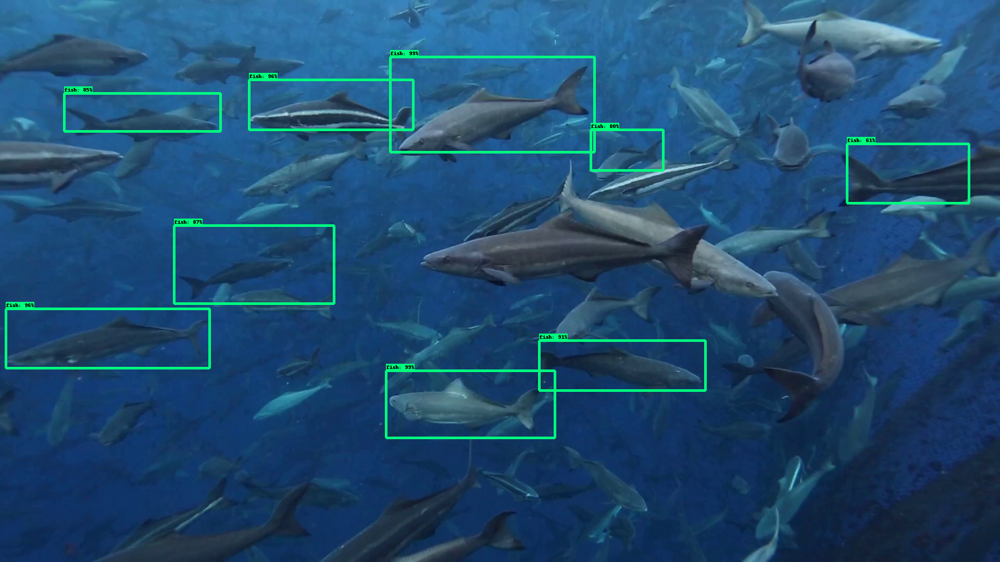

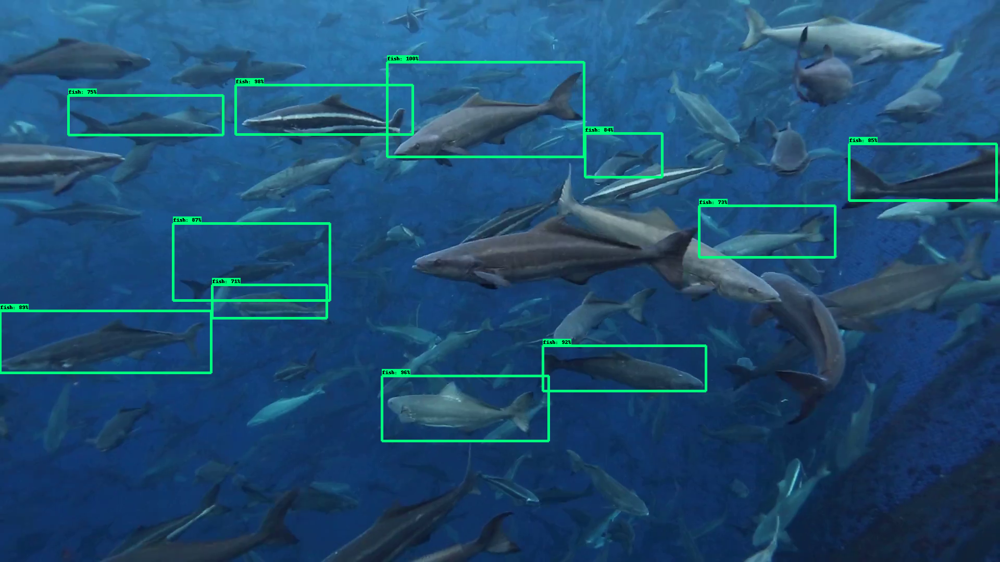

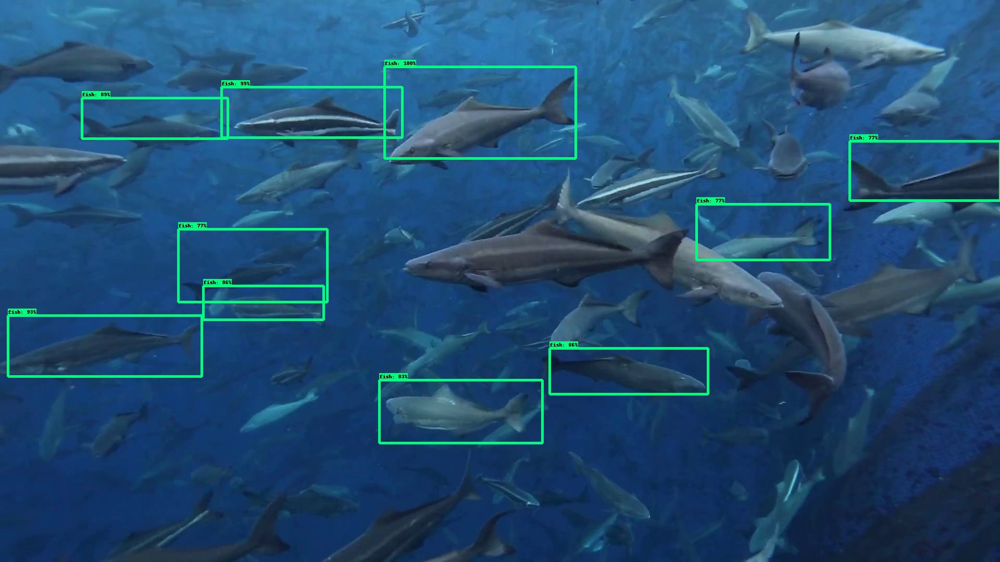

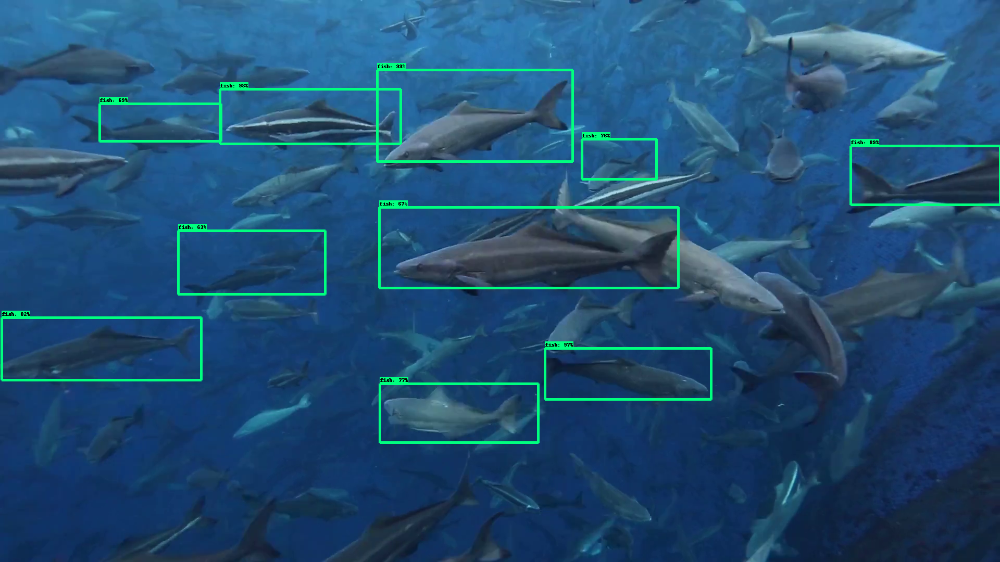

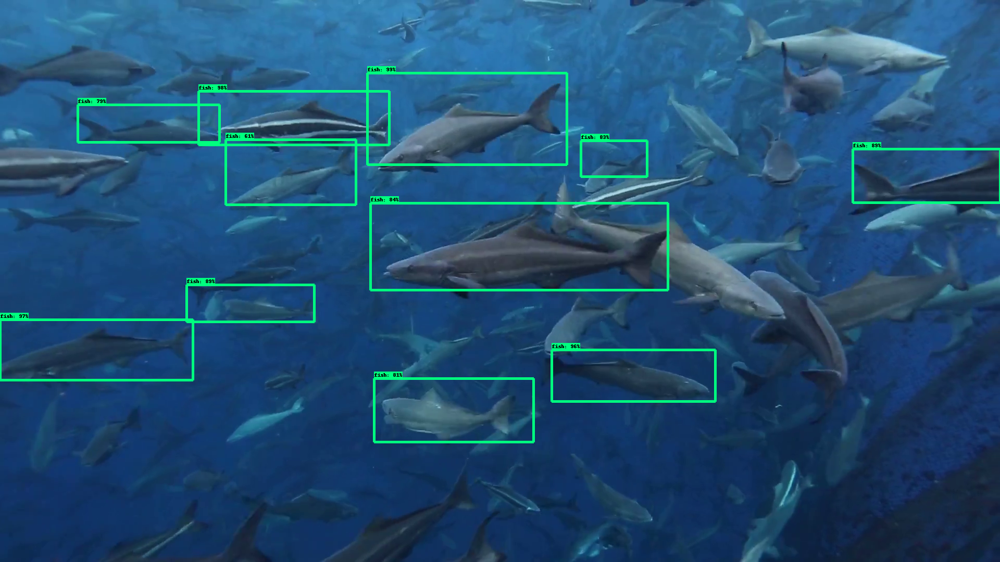

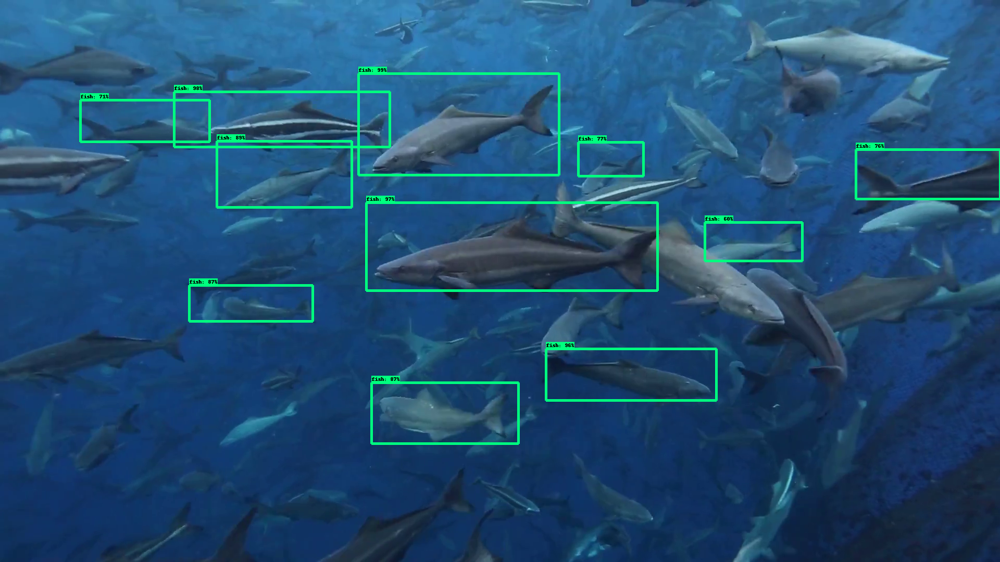

time druation:5.647079706192017


In [56]:
# Showing images on colab with cv2_imshow
from google.colab.patches import cv2_imshow
import time

num_frames = 5 #number of frames to be fed into the model
i = 0

t1 = time.time()
while(video.isOpened()):    
    ret, frame = video.read()
    # Expand frame dimensions to have shape: [None, None, None, 3]
    frame_expanded = np.expand_dims(frame, axis=0)
    # Perform the actual detection by running the model with the image as input
    (boxes, scores, classes, num) = sess.run(
        [detection_boxes, detection_scores, detection_classes, num_detections],
        feed_dict={image_tensor: frame_expanded})

    # Draw the results of the detection (aka 'visulaize the results')
    vis_util.visualize_boxes_and_labels_on_image_array(
        frame,
        np.squeeze(boxes),
        np.squeeze(classes).astype(np.int32),
        np.squeeze(scores),
        category_index,
        use_normalized_coordinates=True,
        line_thickness=5,
        min_score_thresh=0.60)

    # USe cv2_imshow instead og cv2.imshow to display results on colab
    # cv2.imshow('Object detector', frame)
    cv2_imshow(frame)

    # Press 'q' to quit
    if cv2.waitKey(1) == ord('q'):
        break
    if i == num_frames:
        break
    i += 1
t2 = time.time()
print(f'time druation:{t2 - t1}')
# Clean up
video.release()
cv2.destroyAllWindows()

# References



1.   [How To Train an Object Detection Classifier for Multiple Objects Using TensorFlow (GPU) on Windows 10](https://github.com/EdjeElectronics/TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10)
2.   [TensorFlow 2 Object Detection API tutorial](https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/)
3.   [Custom Real-Time Object Detection](https://towardsdatascience.com/custom-real-time-object-detection-in-the-browser-using-tensorflow-js-5ca90538eace)







